In [1]:
import os
import pandas as pd

def add_columns_from_classification(classification_file, connections_file, output_file):
    """
    Adds 'super_class' and 'class' columns to the connections CSV based on the classification CSV.

    Parameters:
    - classification_file: str, path to classification.csv
    - connections_file: str, path to connections.csv
    - output_file: str, path for the output CSV (connections_superclass.csv)
    """

    # Read the classification CSV
    classification_df = pd.read_csv(classification_file)

    # Create a mapping from root_id to super_class and class
    root_to_super = classification_df.set_index(classification_df.columns[0])[classification_df.columns[2]].to_dict()  # Super_class (3rd column)
    root_to_class = classification_df.set_index(classification_df.columns[0])[classification_df.columns[3]].to_dict()  # Class (4th column)

    # Read the connections CSV
    connections_df = pd.read_csv(connections_file)

    # Add the 'super_class' column by mapping 'pre_root_id' to 'super_class'
    connections_df['super_class'] = connections_df[connections_df.columns[0]].map(root_to_super)

    # Add the 'class' column by mapping 'pre_root_id' to 'class'
    connections_df['class'] = connections_df[connections_df.columns[0]].map(root_to_class)

    # Handle missing values (fill NaN) in the new columns
    connections_df['super_class'].fillna('Unknown', inplace=True)
    connections_df['class'].fillna('Unknown', inplace=True)

    # Save the updated DataFrame to a new CSV file
    connections_df.to_csv(output_file, index=False)

    print(f"Successfully updated '{output_file}' with 'super_class' and 'class' columns.")
    print(f"Updated matrix size: {connections_df.shape[0]} rows, {connections_df.shape[1]} columns")

def check_file_details(connections_file):
    """
    Displays the file size, headers, and column titles of the given CSV file.

    Parameters:
    - connections_file: str, path to connections.csv
    """
    
    # Get the file size
    file_size = os.path.getsize(connections_file)
    
    # Read the CSV file
    df = pd.read_csv(connections_file)
    
    # Display file size
    print(f"File size of '{connections_file}': {file_size / (1024 * 1024):.2f} MB")
    
    # Display the headers (first few rows) and column titles
    print("\nHeaders (first 5 rows):")
    print(df.head())

    print("\nColumn titles:")
    print(df.columns.tolist())

    # Display the matrix size (number of rows and columns)
    print(f"\nMatrix size: {df.shape[0]} rows, {df.shape[1]} columns")

# Usage
if __name__ == "__main__":
    classification_csv = '/Users/camellyc/Desktop/Connectomics/FAFB/classification.csv'
    connections_csv = '/Users/camellyc/Desktop/Connectomics/FAFB/connections.csv'
    output_csv = '/Users/camellyc/Desktop/Connectomics/FAFB/connections_superclass.csv'
    
    # Check the original file details
    check_file_details(connections_csv)
    
    # Add the new columns and save the updated CSV
    add_columns_from_classification(classification_csv, connections_csv, output_csv)

    # Check the updated file details
    check_file_details(output_csv)


File size of '/Users/camellyc/Desktop/Connectomics/FAFB/connections.csv': 189.08 MB

Headers (first 5 rows):
          pre_root_id        post_root_id neuropil  syn_count nt_type
0  720575940629970489  720575940631267655   AVLP_R          7    GABA
1  720575940605876866  720575940606514878    LAL_R         15    GABA
2  720575940627737365  720575940628914436     AL_L         32     ACH
3  720575940633587552  720575940626452879    SMP_R         15     ACH
4  720575940616871878  720575940621203973   AVLP_L         13    GABA

Column titles:
['pre_root_id', 'post_root_id', 'neuropil', 'syn_count', 'nt_type']

Matrix size: 3869878 rows, 5 columns
Successfully updated '/Users/camellyc/Desktop/Connectomics/FAFB/connections_superclass.csv' with 'super_class' and 'class' columns.
Updated matrix size: 3869878 rows, 7 columns
File size of '/Users/camellyc/Desktop/Connectomics/FAFB/connections_superclass.csv': 244.74 MB

Headers (first 5 rows):
          pre_root_id        post_root_id neuropil  

In [3]:
import os
import pandas as pd

def check_file_details(connections_file):
    """
    Displays the file size, headers, and column titles of the given CSV file.

    Parameters:
    - connections_file: str, path to connections.csv
    """
    
    # Get the file size
    file_size = os.path.getsize(connections_file)
    
    # Read the CSV file
    df = pd.read_csv(connections_file)
    
    # Display file size
    print(f"File size of '{connections_file}': {file_size / (1024 * 1024):.2f} MB")
    
    # Display the headers (first few rows) and column titles
    print("\nHeaders (first 5 rows):")
    print(df.head())

    print("\nColumn titles:")
    print(df.columns.tolist())

# Usage
if __name__ == "__main__":
    connections_csv = '/Users/camellyc/Desktop/Connectomics/FAFB/connections_superclass.csv'
    check_file_details(connections_csv)


File size of '/Users/camellyc/Desktop/Connectomics/FAFB/connections_superclass.csv': 245.07 MB

Headers (first 5 rows):
          pre_root_id        post_root_id neuropil  syn_count nt_type  \
0  720575940596125868  720575940608552405    LOP_R          5     ACH   
1  720575940596125868  720575940611348834    LOP_R          7     ACH   
2  720575940596125868  720575940613059993    LOP_R          5    GLUT   
3  720575940596125868  720575940616986553    LOP_R          5     ACH   
4  720575940596125868  720575940620124326    LOP_R          8     ACH   

  super_class        class  
0       optic  optic_lobes  
1       optic  optic_lobes  
2       optic  optic_lobes  
3       optic  optic_lobes  
4       optic  optic_lobes  

Column titles:
['pre_root_id', 'post_root_id', 'neuropil', 'syn_count', 'nt_type', 'super_class', 'class']


Attempt 1: Starting from post_root_id 720575940623786376
Attempt 1: Step 1, new_pre_root_id: 720575940618369659, super_class: central
Attempt 1: Step 2, new_pre_root_id: 720575940613414297, super_class: central
Attempt 1: Step 3, new_pre_root_id: 720575940626462014, super_class: ascending
Attempt 1: Step 4, new_pre_root_id: 720575940658654593, super_class: central
Attempt 1: Step 5, new_pre_root_id: 720575940612718563, super_class: ascending
Attempt 1: Step 6, new_pre_root_id: 720575940606648608, super_class: central
Attempt 1: Step 7, new_pre_root_id: 720575940625053773, super_class: central
Attempt 1: Step 8, new_pre_root_id: 720575940621330102, super_class: central
Attempt 1: Reached maximum step count (8) without finding 'sensory'. Ignoring this run.
Attempt 1: Starting from post_root_id 720575940623786376
Attempt 1: Step 1, new_pre_root_id: 720575940610773782, super_class: central
Attempt 1: Step 2, new_pre_root_id: 720575940637494837, super_class: sensory
Attempt 1: Reached 'sens

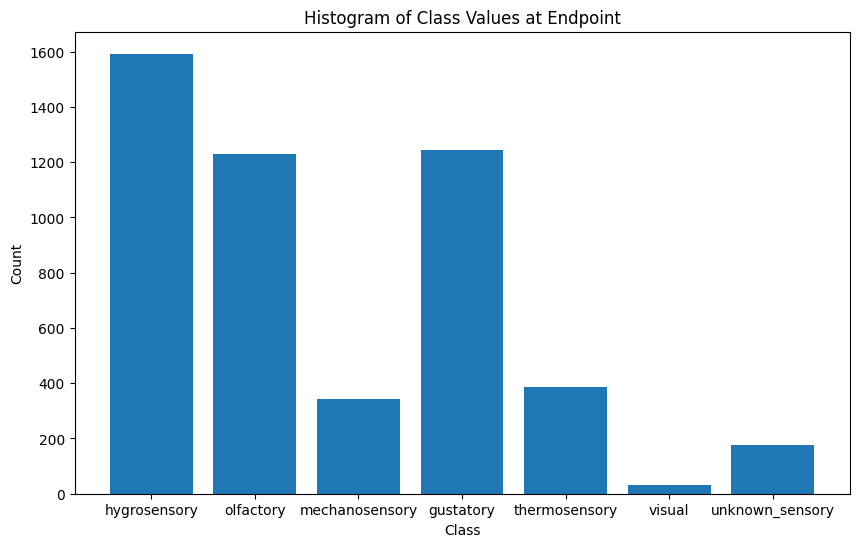

Histogram data saved to /Users/camellyc/Desktop/Connectomics/FAFB/histogram_class_values.csv


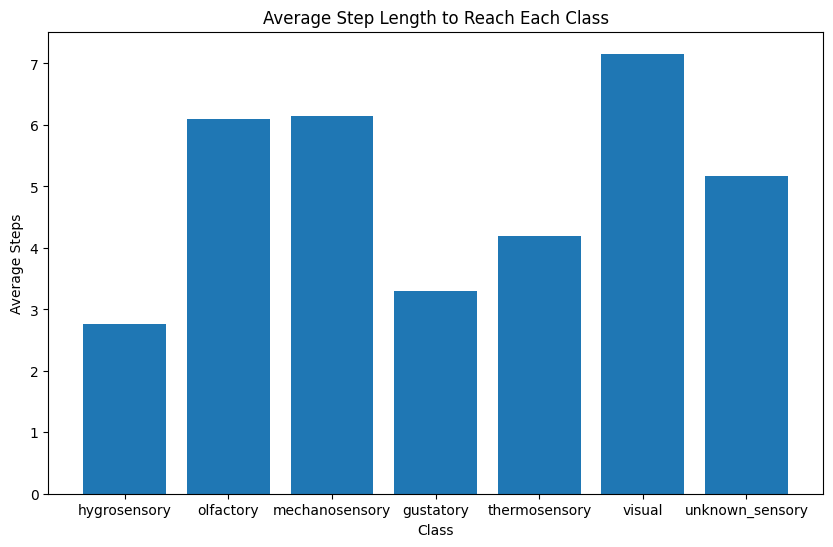

Average steps data saved to /Users/camellyc/Desktop/Connectomics/FAFB/avg_steps_per_class.csv


/var/folders/tz/5xxpw5x57bg8vtkdkhljt7880000gn/T/ipykernel_22552/3534290221.py:118: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Class', y='Steps', data=violin_df, inner="quart", palette="muted")


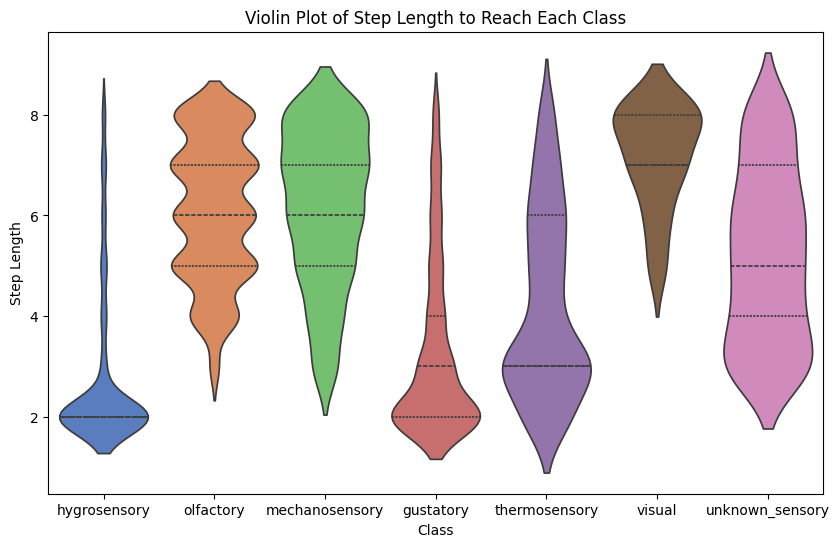

Violin plot data saved to /Users/camellyc/Desktop/Connectomics/FAFB/violin_steps_data.csv
Final neuron IDs saved to /Users/camellyc/Desktop/Connectomics/FAFB/final_neuron_ids.csv

Neuron root IDs where each walk ended:
Walk 1: Ended at neuron root_id 720575940637494837, class: hygrosensory
Walk 2: Ended at neuron root_id 720575940636975582, class: olfactory
Walk 3: Ended at neuron root_id 720575940637084762, class: mechanosensory
Walk 4: Ended at neuron root_id 720575940612455917, class: olfactory
Walk 5: Ended at neuron root_id 720575940616811265, class: gustatory
Walk 6: Ended at neuron root_id 720575940616616861, class: gustatory
Walk 7: Ended at neuron root_id 720575940619075073, class: hygrosensory
Walk 8: Ended at neuron root_id 720575940645431075, class: olfactory
Walk 9: Ended at neuron root_id 720575940620602236, class: hygrosensory
Walk 10: Ended at neuron root_id 720575940645760820, class: mechanosensory
Walk 11: Ended at neuron root_id 720575940615856345, class: thermosenso

In [1]:
import pandas as pd
import random
import matplotlib.pyplot as plt
from collections import defaultdict
import seaborn as sns
import os

def random_walk_to_sensory(connections_df, start_post_root_id, iterations=100, max_steps=10):
    """
    Perform a random walk starting from a provided post_root_id. Each iteration,
    randomly selects a pre_root_id connected to the current post_root_id and continues
    until a neuron with super_class == "sensory" is reached or a maximum number of steps is reached.
    """
    
    class_counts = defaultdict(int)
    total_steps_per_class = defaultdict(list)
    final_neuron_ids = []
    timed_out_runs = 0
    successful_iterations = 0  # Only increment when sensory is reached

    while successful_iterations < iterations:
        current_post_root_id = start_post_root_id
        steps = 0

        print(f"Attempt {successful_iterations+1}: Starting from post_root_id {start_post_root_id}")

        while steps < max_steps:  # Only allow up to max_steps iterations
            # Filter the dataframe for rows where the post_root_id matches the current post_root_id
            connections_subset = connections_df[connections_df['post_root_id'] == current_post_root_id]
            
            if connections_subset.empty:
                print(f"Attempt {successful_iterations+1}: No more connections. Ending walk with {steps} steps.")
                break
            
            # Randomly select a pre_root_id from the subset
            random_row = connections_subset.sample(n=1)
            new_pre_root_id = random_row['pre_root_id'].values[0]
            new_super_class = random_row['super_class'].values[0]
            new_class = random_row['class'].values[0]
            
            # Increment steps
            steps += 1

            print(f"Attempt {successful_iterations+1}: Step {steps}, new_pre_root_id: {new_pre_root_id}, super_class: {new_super_class}")

            # If super_class is "sensory", stop the walk
            if new_super_class == 'sensory':
                class_counts[new_class] += 1
                total_steps_per_class[new_class].append(steps)
                final_neuron_ids.append((new_pre_root_id, new_class))  # Store both neuron ID and class
                print(f"Attempt {successful_iterations+1}: Reached 'sensory' neuron after {steps} steps, class: {new_class}, neuron_id: {new_pre_root_id}")
                successful_iterations += 1
                break
            
            # Otherwise, continue the walk with the new pre_root_id
            current_post_root_id = new_pre_root_id

        # If we reach max_steps without finding "sensory", ignore the attempt
        if steps == max_steps:
            print(f"Attempt {successful_iterations+1}: Reached maximum step count ({max_steps}) without finding 'sensory'. Ignoring this run.")
            timed_out_runs += 1

    # Calculate average steps per class
    avg_steps_per_class = {k: sum(v) / len(v) for k, v in total_steps_per_class.items()}

    return class_counts, avg_steps_per_class, final_neuron_ids, total_steps_per_class, timed_out_runs

def plot_histogram(class_counts, output_dir):
    """
    Plot a histogram of the class values from the random walk endpoint and save the data as a CSV.
    """
    plt.figure(figsize=(10, 6))
    plt.bar(class_counts.keys(), class_counts.values())
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.title('Histogram of Class Values at Endpoint')
    plt.show()
    
    # Save the histogram data as CSV
    histogram_data = pd.DataFrame(list(class_counts.items()), columns=['Class', 'Count'])
    histogram_csv_path = os.path.join(output_dir, 'histogram_class_values.csv')
    histogram_data.to_csv(histogram_csv_path, index=False)
    print(f"Histogram data saved to {histogram_csv_path}")

def plot_avg_steps(avg_steps_per_class, output_dir):
    """
    Plot the average step length to reach each class and save the data as a CSV.
    """
    plt.figure(figsize=(10, 6))
    plt.bar(avg_steps_per_class.keys(), avg_steps_per_class.values())
    plt.xlabel('Class')
    plt.ylabel('Average Steps')
    plt.title('Average Step Length to Reach Each Class')
    plt.show()
    
    # Save the average steps data as CSV
    avg_steps_data = pd.DataFrame(list(avg_steps_per_class.items()), columns=['Class', 'Average Steps'])
    avg_steps_csv_path = os.path.join(output_dir, 'avg_steps_per_class.csv')
    avg_steps_data.to_csv(avg_steps_csv_path, index=False)
    print(f"Average steps data saved to {avg_steps_csv_path}")

def plot_violin_steps(total_steps_per_class, output_dir):
    """
    Plot a violin plot of the step lengths to reach each class and save the data as a CSV.
    """
    # Prepare the data for seaborn
    steps_data = []
    classes_data = []

    for class_label, steps_list in total_steps_per_class.items():
        steps_data.extend(steps_list)
        classes_data.extend([class_label] * len(steps_list))

    violin_df = pd.DataFrame({'Class': classes_data, 'Steps': steps_data})

    # Create the violin plot
    plt.figure(figsize=(10, 6))
    sns.violinplot(x='Class', y='Steps', data=violin_df, inner="quart", palette="muted")
    plt.xlabel('Class')
    plt.ylabel('Step Length')
    plt.title('Violin Plot of Step Length to Reach Each Class')
    plt.show()
    
    # Save the violin plot data as CSV
    violin_csv_path = os.path.join(output_dir, 'violin_steps_data.csv')
    violin_df.to_csv(violin_csv_path, index=False)
    print(f"Violin plot data saved to {violin_csv_path}")

def print_final_neuron_ids(final_neuron_ids, output_dir):
    """
    Print the final neuron root IDs where each random walk ended and save them as a CSV.
    """
    final_ids_df = pd.DataFrame(final_neuron_ids, columns=['Neuron ID', 'Class'])
    final_neurons_csv_path = os.path.join(output_dir, 'final_neuron_ids.csv')
    final_ids_df.to_csv(final_neurons_csv_path, index=False)
    print(f"Final neuron IDs saved to {final_neurons_csv_path}")

    print("\nNeuron root IDs where each walk ended:")
    for idx, neuron_id in enumerate(final_neuron_ids, start=1):
        print(f"Walk {idx}: Ended at neuron root_id {neuron_id[0]}, class: {neuron_id[1]}")

# Example usage
if __name__ == "__main__":
    # Load the connections CSV
    connections_csv = '/Users/camellyc/Desktop/Connectomics/FAFB/connections_superclass.csv'
    connections_df = pd.read_csv(connections_csv)

    # Set the starting post_root_id
    start_post_root_id = 720575940623786376    # Replace with actual post_root_id

    # Perform the random walk algorithm with a maximum of 10 steps
    output_dir = '/Users/camellyc/Desktop/Connectomics/FAFB'  # Directory to save the outputs
    class_counts, avg_steps_per_class, final_neuron_ids, total_steps_per_class, timed_out_runs = random_walk_to_sensory(connections_df, start_post_root_id, iterations=5000, max_steps=8)

    # Plot the histogram of class values and save the data
    plot_histogram(class_counts, output_dir)

    # Plot the average step length per class and save the data
    plot_avg_steps(avg_steps_per_class, output_dir)

    # Plot the violin plot of steps per class and save the data
    plot_violin_steps(total_steps_per_class, output_dir)

    # Print and save the final neuron root IDs
    print_final_neuron_ids(final_neuron_ids, output_dir)

    percentage_timed_out = timed_out_runs / (timed_out_runs + 5000)
    print(f"Percentage of timed out runs: {percentage_timed_out}")
